# HW3

Overall rules:

- Do not split your answers into separate files. All answers must be in a single jupyter notebook.
- Obtain all required remote data using the appropriate API unless otherwise is specified.
- Refrain from using code comments to explain what has been done. Document your steps by writing appropriate markdown cells in your notebook.
- Avoid duplicating code by copying and pasting it from one cell to another. If copying and pasting is necessary, develop a suitable function for the task at hand and call that function.
- When providing parameters to a function, never use global variables. Instead, always pass parameters explicitly and always make use of local variables.
- Document your use of LLM models (ChatGPT, Claude, Code Pilot etc). Either take screenshots of your steps and include them with this notebook, or give me a full log (both questions and answers) in a markdown file named HW3-LLM-LOG.md.

Failure to adhere to these guidelines will result in a 15-point deduction for each infraction.

## Atabey's Notes and Comments

I really liked the way you constructed the answers even though you have heavy code repetition. You are doing everything by hand. Good work! Cross-validation is also ok but you have no error analysis. You should consider tidying up. Put repeated code into a function and call that function.

( 85 + 85 + 85 - 15 ) /3 = 80

In [1]:
!pip install ucimlrepo
!pip install medmnist
!pip install scipy




     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 34.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.1 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=6

In [2]:
import numpy as np
import random
import matplotlib.pyplot as plt

from ucimlrepo import fetch_ucirepo
from medmnist import RetinaMNIST
from scipy.io import loadmat

## Q1

For this question we are going to use the [Dry Bean Data Set](https://archive.ics.uci.edu/dataset/602/dry+bean+dataset) from UCI.

In [ ]:
dry_bean = fetch_ucirepo(id=602)
X_beans = dry_bean.data.features
y_beans = dry_bean.data.targets

1. Use all of the non-ensemble classification algorithms we have seen in this class on this dataset. Compare their accuracy, precision, and recall using an appropriate cross-validation method. Your results must include a time complexity argument, and an error analysis.
2. Use all of the ensemble classification algorithms given in the lectures using both One-vs-Rest and One-vs-One schemes on this dataset, and compare them. Again, your analyses must include time complexity and error bounds.
3. Which of these options and/or models would you use. Explain.

Do not construct multi-class models. Instead, construct binary classifiers for each class and test them individually.

In [ ]:
X_beans.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRatio,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,Roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166


İlk olarak elimizdeki verinin boyutunu öğrenelimki ve ground truthda kaç sınıfa ayrıldığını sonrasında modelleri direkt kullanabilcem mi yoksa veriyi küçültmem gerekicek mi ona göre modelleri uygulayabilirim.

In [ ]:
print("Özellik sayısı (d):", X_beans.shape[1])
print("Örnek sayısı (n):", X_beans.shape[0])
print("Sınıf sayısı:", len(np.unique(y_beans)))


Özellik sayısı (d): 16
Örnek sayısı (n): 13611
Sınıf sayısı: 7


İlk olarak veri setini test ve train olarak ayırıp sonrasında scale edelim.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score




X_train, X_test, y_train, y_test = train_test_split(X_beans, y_beans, test_size=0.2, random_state=42, stratify=y_beans)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)


X_test_scaled = scaler.transform(X_test)


In [ ]:
lr_model = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
lr_model.fit(X_train_scaled, y_train)
y_pred_lr = lr_model.predict(X_test_scaled)

print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))
lr_cv_scores = cross_val_score(lr_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print("Logistic Regression Cross-Validation Scores:", lr_cv_scores)
print("Logistic Regression Average CV Score:", np.mean(lr_cv_scores))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Logistic Regression Accuracy: 0.9206757253029747
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.93      0.94      0.94       326
    DERMASON       0.92      0.91      0.92       709
       HOROZ       0.96      0.95      0.96       386
       SEKER       0.93      0.95      0.94       406
        SIRA       0.85      0.88      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will 

Logistic Regression Cross-Validation Scores: [0.93204775 0.91414141 0.92470156 0.92237023 0.93063849]
Logistic Regression Average CV Score: 0.9247798906085958


Logistic Regression uyguladıktan sonra sonucları incelediğimde accuracy nin %92 gelmesi doğruluğun yüksek olması ve Cv scoreslara bakınca onun da %92 gelmesi aynı zamanda modelin cok da tutarlı oldugunu gösteriyor yani modelimiz bu veri seti için çok basarılı olmus.

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X_train_scaled, y_train)
y_pred_knn = knn_model.predict(X_test_scaled)

print("KNN Accuracy:", accuracy_score(y_test, y_pred_knn))
print(classification_report(y_test, y_pred_knn))
knn_cv_scores = cross_val_score(knn_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print("KNN Cross-Validation Scores:", knn_cv_scores)
print("KNN Average CV Score:", np.mean(knn_cv_scores))


/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


KNN Accuracy: 0.9166360631656262
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.91       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.92      0.94      0.93       326
    DERMASON       0.91      0.91      0.91       709
       HOROZ       0.95      0.95      0.95       386
       SEKER       0.95      0.94      0.95       406
        SIRA       0.84      0.87      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723



/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

KNN Cross-Validation Scores: [0.93250689 0.91781451 0.91781451 0.91548002 0.92282958]
KNN Average CV Score: 0.9212891009734039


KNN uyguladıktan sonra sonucları incelediğimde accuracy nin %92 gelmesi doğruluğun yüksek olması ve Cv scoreslara bakınca onun da %92 gelmesi aynı zamanda modelin cok da tutarlı oldugunu gösteriyor yani modelimiz bu veri seti için çok basarılı olmus.

Veri setimiz cok büyük olmasa da SVM i lineer kernel ile deneyelim.

In [ ]:
from sklearn.svm import SVC
svm_linear_model = SVC(kernel='linear', random_state=42)

svm_linear_model.fit(X_train_scaled, y_train)


y_pred_svm_linear = svm_linear_model.predict(X_test_scaled)


print("SVM (Linear Kernel) Accuracy:", accuracy_score(y_test, y_pred_svm_linear))
print(classification_report(y_test, y_pred_svm_linear))


svm_linear_cv_scores = cross_val_score(svm_linear_model, X_train_scaled, y_train, cv=5, scoring='accuracy')
print("SVM (Linear Kernel) Cross-Validation Scores:", svm_linear_cv_scores)
print("SVM (Linear Kernel) Average CV Score:", np.mean(svm_linear_cv_scores))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


SVM (Linear Kernel) Accuracy: 0.9221446933529196
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       265
      BOMBAY       1.00      0.99      1.00       104
        CALI       0.93      0.94      0.94       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.96      0.95      0.96       386
       SEKER       0.94      0.96      0.95       406
        SIRA       0.87      0.86      0.87       527

    accuracy                           0.92      2723
   macro avg       0.94      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

SVM (Linear Kernel) Cross-Validation Scores: [0.93296602 0.91460055 0.92837466 0.93063849 0.93201654]
SVM (Linear Kernel) Average CV Score: 0.9277192520688574


Sonuclara baktığımızda modelin doğru ve tutarlı oldugunu görüyoruz.

Simdi sorumuzun 2. kısmına geciyoruz son hafta öğrendiğimiz RandomForest Adaboost ve gradientboost kullanıcaz.

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import fetch_openml
import numpy as np


In [ ]:

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rf_model_ovr = OneVsRestClassifier(rf_model)
rf_model_ovo = OneVsOneClassifier(rf_model)


rf_model_ovr.fit(X_train_scaled, y_train)
rf_model_ovo.fit(X_train_scaled, y_train)


y_pred_ovr = rf_model_ovr.predict(X_test_scaled)
y_pred_ovo = rf_model_ovo.predict(X_test_scaled)


print("Random Forest OvR Accuracy:", accuracy_score(y_test, y_pred_ovr))
print("Random Forest OvO Accuracy:", accuracy_score(y_test, y_pred_ovo))


print("Random Forest OvR Classification Report:\n", classification_report(y_test, y_pred_ovr))
print("Random Forest OvO Classification Report:\n", classification_report(y_test, y_pred_ovo))
rf_cv_ovr = cross_val_score(rf_model_ovr, X_train_scaled, y_train, cv=5)
rf_cv_ovo = cross_val_score(rf_model_ovo, X_train_scaled, y_train, cv=5)
print("Random Forest OvR CV Scores:", rf_cv_ovr)
print("Random Forest OvO CV Scores:", rf_cv_ovo)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Random Forest OvR Accuracy: 0.9192067572530297
Random Forest OvO Accuracy: 0.9214102093279471
Random Forest OvR Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.93      0.89      0.91       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94       326
    DERMASON       0.90      0.92      0.91       709
       HOROZ       0.97      0.95      0.96       386
       SEKER       0.94      0.96      0.95       406
        SIRA       0.86      0.86      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

Random Forest OvO Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94       326
    DERM

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Random Forest OvR CV Scores: [0.93204775 0.92011019 0.92470156 0.92145154 0.92788241]
Random Forest OvO CV Scores: [0.93067034 0.92056933 0.92194674 0.91961415 0.9297198 ]


Randomforest modelimize baktığımızda çok iyi sonuç verdiğini görüyoruz accuracy ve cv score olarak ama modelimizin çalısması 3 dakika sürdü , non ensemble modellere göre baya yavas aslında.

In [ ]:

ada_model = AdaBoostClassifier(n_estimators=100, random_state=42)


ada_model_ovr = OneVsRestClassifier(ada_model)
ada_model_ovo = OneVsOneClassifier(ada_model)


ada_model_ovr.fit(X_train_scaled, y_train)
ada_model_ovo.fit(X_train_scaled, y_train)


y_pred_ovr = ada_model_ovr.predict(X_test_scaled)
y_pred_ovo = ada_model_ovo.predict(X_test_scaled)


print("AdaBoost OvR Accuracy:", accuracy_score(y_test, y_pred_ovr))
print("AdaBoost OvO Accuracy:", accuracy_score(y_test, y_pred_ovo))


print("AdaBoost OvR Classification Report:\n", classification_report(y_test, y_pred_ovr))
print("AdaBoost OvO Classification Report:\n", classification_report(y_test, y_pred_ovo))
ada_cv_ovr = cross_val_score(ada_model_ovr, X_train_scaled, y_train, cv=5)
ada_cv_ovo = cross_val_score(ada_model_ovo, X_train_scaled, y_train, cv=5)
print("AdaBoost OvR CV Scores:", ada_cv_ovr)
print("AdaBoost OvO CV Scores:", ada_cv_ovo)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


AdaBoost OvR Accuracy: 0.9159015791406537
AdaBoost OvO Accuracy: 0.9232464193903782
AdaBoost OvR Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.92      0.94      0.93       326
    DERMASON       0.91      0.91      0.91       709
       HOROZ       0.96      0.92      0.94       386
       SEKER       0.95      0.94      0.95       406
        SIRA       0.84      0.88      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

AdaBoost OvO Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.91      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.93      0.95      0.94       326
    DERMASON       0.90     

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

AdaBoost OvR CV Scores: [0.92929293 0.92378329 0.92102847 0.91226458 0.92834175]
AdaBoost OvO CV Scores: [0.93204775 0.91873278 0.92056933 0.92191089 0.92696371]


Aynı sekilde bu modelimiz cok basarılı ama baya yavas kaldı.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier

gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)


gb_model_ovr = OneVsRestClassifier(gb_model)
gb_model_ovo = OneVsOneClassifier(gb_model)


gb_model_ovr.fit(X_train_scaled, y_train)
gb_model_ovo.fit(X_train_scaled, y_train)


y_pred_ovr = gb_model_ovr.predict(X_test_scaled)
y_pred_ovo = gb_model_ovo.predict(X_test_scaled)


print("Gradient Boosting OvR Accuracy:", accuracy_score(y_test, y_pred_ovr))
print("Gradient Boosting OvO Accuracy:", accuracy_score(y_test, y_pred_ovo))

print("Gradient Boosting OvR Classification Report:\n", classification_report(y_test, y_pred_ovr))
print("Gradient Boosting OvO Classification Report:\n", classification_report(y_test, y_pred_ovo))

gb_model = GradientBoostingClassifier(n_estimators=100, random_state=42)


gb_model_ovr = OneVsRestClassifier(gb_model)
gb_model_ovo = OneVsOneClassifier(gb_model)


gb_model_ovr.fit(X_train_scaled, y_train)
gb_model_ovo.fit(X_train_scaled, y_train)


y_pred_ovr = gb_model_ovr.predict(X_test_scaled)
y_pred_ovo = gb_model_ovo.predict(X_test_scaled)

print("Gradient Boosting OvR Accuracy:", accuracy_score(y_test, y_pred_ovr))
print("Gradient Boosting OvO Accuracy:", accuracy_score(y_test, y_pred_ovo))

print("Gradient Boosting OvR Classification Report:\n", classification_report(y_test, y_pred_ovr))
print("Gradient Boosting OvO Classification Report:\n", classification_report(y_test, y_pred_ovo))

gb_cv_ovr = cross_val_score(gb_model_ovr, X_train_scaled, y_train, cv=5)


gb_cv_ovo = cross_val_score(gb_model_ovo, X_train_scaled, y_train, cv=5)


print("Gradient Boosting OvR CV Scores:", gb_cv_ovr)
print("Gradient Boosting OvO CV Scores:", gb_cv_ovo)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Gradient Boosting OvR Accuracy: 0.9206757253029747
Gradient Boosting OvO Accuracy: 0.9217774513404333
Gradient Boosting OvR Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.93      0.94      0.94       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.96      0.95      0.95       386
       SEKER       0.95      0.95      0.95       406
        SIRA       0.86      0.86      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

Gradient Boosting OvO Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94   

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Gradient Boosting OvR Accuracy: 0.9206757253029747
Gradient Boosting OvO Accuracy: 0.9217774513404333
Gradient Boosting OvR Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.93      0.94      0.94       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.96      0.95      0.95       386
       SEKER       0.95      0.95      0.95       406
        SIRA       0.86      0.86      0.86       527

    accuracy                           0.92      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

Gradient Boosting OvO Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94   

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

Gradient Boosting OvR CV Scores: [0.93480257 0.92056933 0.92194674 0.92466697 0.93752871]
Gradient Boosting OvO CV Scores: [0.93296602 0.92286501 0.92332415 0.92466697 0.93339458]


Bu algorştmamızın çalısması ve cıktı almam tam 10 dakika sürdü,accuracy ve cv scoreslar cok uyumlu model güzel sonuc verdi ama zaman acısından mantıklı değil

Şimdi derste işlediğimiz diğer ensemle modelleri de içeren bir fonksiyonla pca uygulayarak analiz yapalım.

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, accuracy_score
import time
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier


label_encoder = LabelEncoder()


y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)


pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)


models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "Random Forest": RandomForestClassifier(n_estimators=100),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100),
    "AdaBoost": AdaBoostClassifier(n_estimators=100),
    "XGBoost": XGBClassifier(n_estimators=100),
    "LightGBM": LGBMClassifier(n_estimators=100)
}


def apply_custom_ensemble_models_with_time(X_train, X_test, y_train, y_test):
    for model_name, model in models.items():
        start_time = time.time()


        model.fit(X_train, y_train)


        end_time = time.time()
        training_time = end_time - start_time

        y_pred = model.predict(X_test)


        acc = accuracy_score(y_test, y_pred)
        cv_scores = cross_val_score(model, X_train, y_train, cv=5)  # 5-fold cross-validation
        cv_mean = np.mean(cv_scores)
        cv_std = np.std(cv_scores)

        print(f"Model: {model_name}")
        print(f"Accuracy: {acc:.4f}")
        print("Classification Report:")
        print(classification_report(y_test, y_pred))
        print(f"Training time: {training_time:.4f} seconds")
        print(f"Cross-Validation Mean Score: {cv_mean:.4f}")
        print(f"Cross-Validation Std Dev: {cv_std:.4f}")
        print("-" * 50)

apply_custom_ensemble_models_with_time(X_train_pca, X_test_pca, y_train_encoded, y_test_encoded)


/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:110: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/preprocessing/_label.py:129: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


Model: Logistic Regression
Accuracy: 0.8873
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.71      0.76       265
           1       1.00      0.99      1.00       104
           2       0.81      0.86      0.83       326
           3       0.92      0.90      0.91       709
           4       0.96      0.95      0.95       386
           5       0.92      0.94      0.93       406
           6       0.83      0.87      0.85       527

    accuracy                           0.89      2723
   macro avg       0.89      0.89      0.89      2723
weighted avg       0.89      0.89      0.89      2723

Training time: 0.3675 seconds
Cross-Validation Mean Score: 0.8892
Cross-Validation Std Dev: 0.0053
--------------------------------------------------
Model: K-Nearest Neighbors
Accuracy: 0.8898
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.72      0.78       265
          

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Model: XGBoost
Accuracy: 0.8806
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.69      0.73       265
           1       1.00      0.98      0.99       104
           2       0.80      0.83      0.81       326
           3       0.90      0.91      0.91       709
           4       0.95      0.95      0.95       386
           5       0.93      0.94      0.94       406
           6       0.84      0.84      0.84       527

    accuracy                           0.88      2723
   macro avg       0.89      0.88      0.88      2723
weighted avg       0.88      0.88      0.88      2723

Training time: 1.0299 seconds
Cross-Validation Mean Score: 0.8873
Cross-Validation Std Dev: 0.0033
--------------------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[L

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8710, number of used features: 4
[LightGBM] [Info] Start training from score -2.331708
[LightGBM] [Info] Start training from score -3.261086
[LightGBM] [Info] Start training from score -2.122371
[LightGBM] [Info] Start training from score -1.344692
[LightGBM] [Info] Start training from score -1.954211
[LightGBM] [Info] Start training from score -1.905189
[LightGBM] [Info] Start training from score -1.641520
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8710, number of used features: 4
[LightGBM] [Info] Start training from score -2.331708
[LightGBM] [Info] Start training from score -3.261086
[LightGBM] [Info] Start training from score -2.122371
[LightGBM] [Info] Start training from score -1.345133
[LightGBM] [Info] Start training from score -1.955022
[LightGBM] [Info] Start training from score -1.904418
[LightGBM] [Info] Start training from score -1.640927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8710, number of used features: 4
[LightGBM] [Info] Start training from score -2.331708
[LightGBM] [Info] Start training from score -3.261086
[LightGBM] [Info] Start training from score -2.121412
[LightGBM] [Info] Start training from score -1.345133
[LightGBM] [Info] Start training from score -1.955022
[LightGBM] [Info] Start training from score -1.904418
[LightGBM] [Info] Start training from score -1.641520
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8711, number of used features: 4
[LightGBM] [Info] Start training from score -2.333005
[LightGBM] [Info] Start training from score -3.258211
[LightGBM] [Info] Start training from score -2.122485
[LightGBM] [Info] Start training from score -1.344807
[LightGBM] [Info] Start training from score -1.954326
[LightGBM] [Info] Start training from score -1.904533
[LightGBM] [Info] Start training from score -1.641635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1020
[LightGBM] [Info] Number of data points in the train set: 8711, number of used features: 4
[LightGBM] [Info] Start training from score -2.333005
[LightGBM] [Info] Start training from score -3.258211
[LightGBM] [Info] Start training from score -2.122485
[LightGBM] [Info] Start training from score -1.344807
[LightGBM] [Info] Start training from score -1.954326
[LightGBM] [Info] Start training from score -1.904533
[LightGBM] [Info] Start training from score -1.641635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Sonuclara baktığımzda pca uygulamak serveri baya rahatlattı ama accuracy i hafif düşürdü. Baktığımzda bu veri setinde kullanıcağım model muhtemelen logistic regression olurdu hem vakit hem accuracy aççısından hem de model açıklanabilir olduğu için.

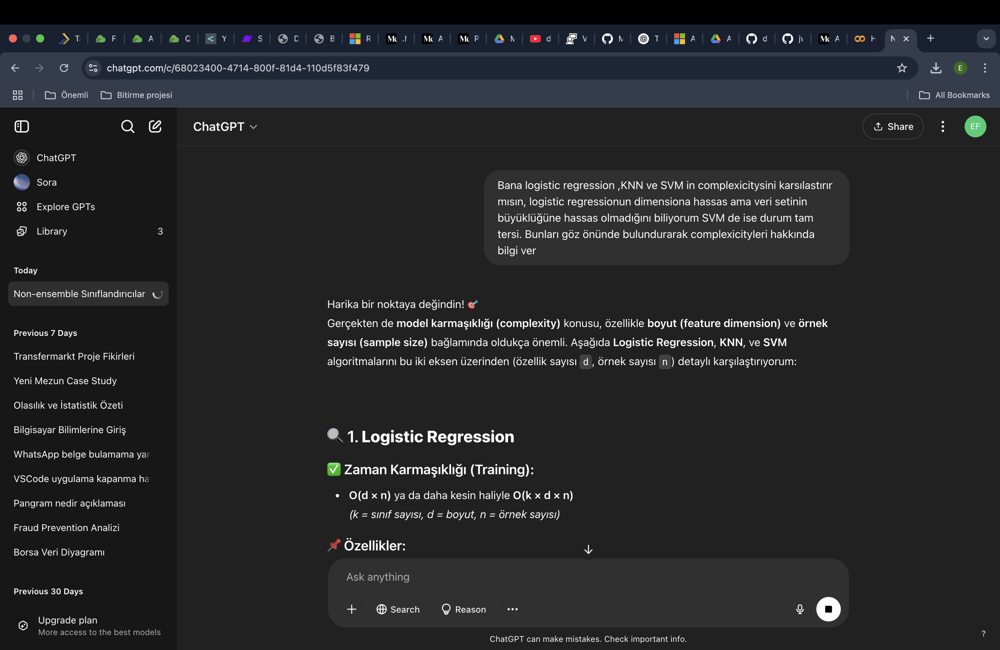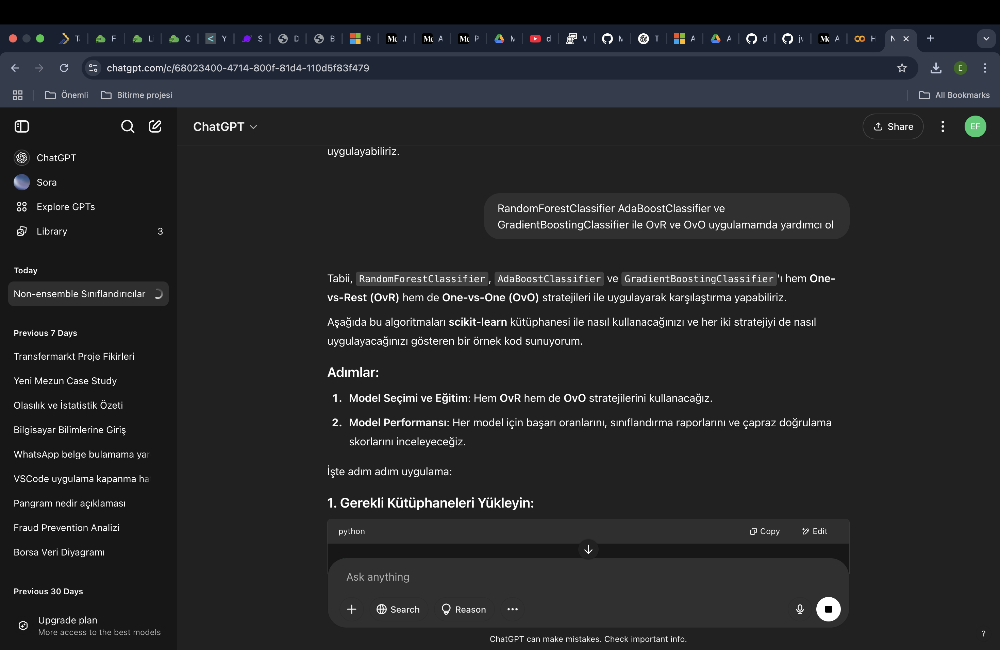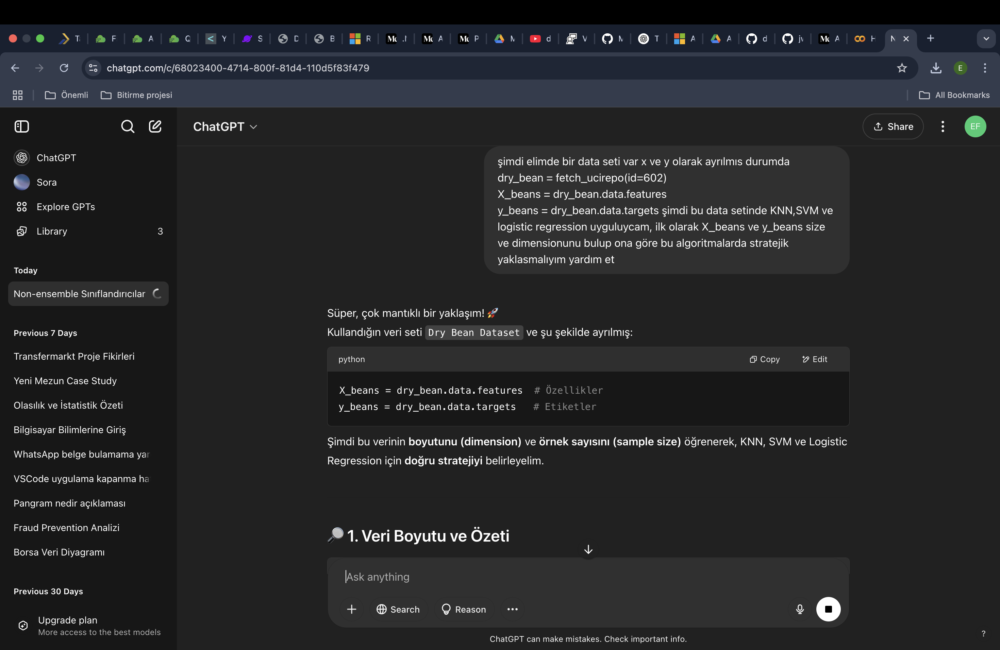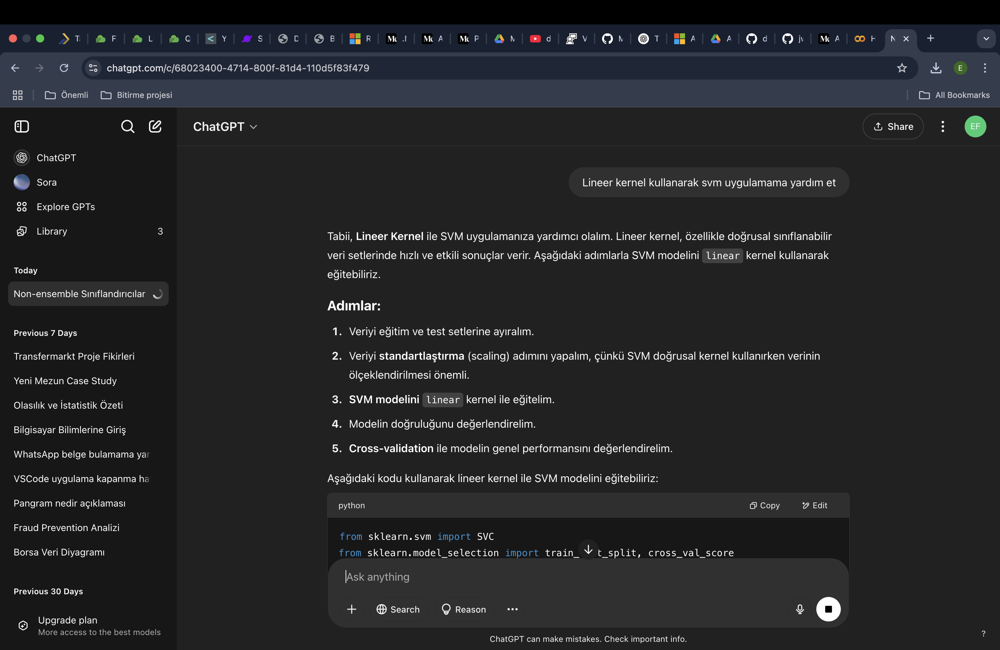

## Q2

For this question, we are going to use one of the [Medical MNIST]() datasets. Specifically, we are going to work with Retine MNIST dataset.

In [3]:
retina_train = RetinaMNIST(download=True, split='train')
retina_test = RetinaMNIST(download=True, split='test')

100%|██████████| 3.29M/3.29M [00:00<00:00, 4.27MB/s]


The RetinaMNIST is based on the DeepDRiD challenge, which provides a dataset of 1,600 retina fundus images. The class variable designates the 5-level grading of diabetic retinopathy severity, encoded as integers from 0 to 4.

In [4]:
np.unique(retina_train.labels.reshape(-1))

array([0, 1, 2, 3, 4], dtype=uint8)

Here is a sample image from the training subset.

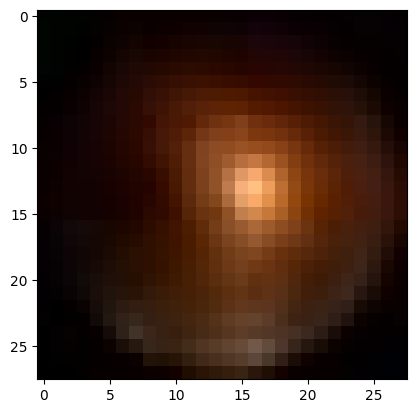

In [5]:
N = retina_train.imgs.shape[0]
plt.imshow(retina_train.imgs[random.randint(0,N)])

Note that in this dataset each picture has a distict label, and your task is to develop supervised models to attach these labels to each picture.

As before:

1. Use all of the non-ensemble classification algorithms we have seen in this class on this dataset. Compare their accuracy, precision, and recall using an appropriate cross-validation method. Your results must include a time complexity argument, and an error analysis.
2. Use all of the ensemble classification algorithms given in the lectures using both One-vs-Rest and One-vs-One schemes on this dataset, and compare them. Again, your analyses must include time complexity and error bounds.
3. Which of these options and/or models would you use. Explain.
   
Again, as before, do not construct multi-class models. Instead, construct binary classifiers for each class and test them individually. You need to train your models on the training set, and cross-validate on the test set.

şimdi ilk önce veri setimizin büyüklüğüne ve boyutuna bakıp ona göre bir yaklasım izleyelim.

In [6]:
print("Eğitim Görüntü Sayısı:", retina_train.imgs.shape[0])
print("Görüntü Boyutu (tek görüntü):", retina_train.imgs[0].shape)


Eğitim Görüntü Sayısı: 1080
Görüntü Boyutu (tek görüntü): (28, 28, 3)


Göreselleri indirgeyerek dataframe e uygun hale getirelim, ondan sonra scale edelim.

In [7]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = retina_train.imgs.reshape(len(retina_train.imgs), -1).astype("float32")
y = retina_train.labels

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


İlk olarak cok boyutlu verilerde iyi çalısmadıgını bildiğimiz logistic regression ile baslayalım.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import time


start = time.time()


lr = LogisticRegression(max_iter=1000, multi_class='ovr', solver='lbfgs')


cv_scores = cross_val_score(lr, X_train_scaled, y_train, cv=5, scoring='accuracy')

lr.fit(X_train_scaled, y_train)


y_pred = lr.predict(X_test_scaled)

end = time.time()


print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Cross-Validation Accuracy Scores:", cv_scores)
print("CV Mean Accuracy:", np.mean(cv_scores))
print("CV Std Deviation:", np.std(cv_scores))
print("Eğitim süresi (saniye):", round(end - start, 2))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRest

Test Accuracy: 0.4537037037037037
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.74      0.71        94
           1       0.32      0.24      0.28        33
           2       0.27      0.30      0.28        40
           3       0.20      0.17      0.18        35
           4       0.14      0.14      0.14        14

    accuracy                           0.45       216
   macro avg       0.32      0.32      0.32       216
weighted avg       0.44      0.45      0.44       216

Cross-Validation Accuracy Scores: [0.45086705 0.52023121 0.50867052 0.42196532 0.47674419]
CV Mean Accuracy: 0.4756956580185509
CV Std Deviation: 0.036263661721069915
Eğitim süresi (saniye): 28.12


Modelimizin accuracy ve cv scorelarına baktığımızda modelin veriyle pek de iyi çalısmadığını gördük. Accuracy ve cv score yakın olması da modelin overfit yapmadığını gösteriyor.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score
import time


start = time.time()

knn = KNeighborsClassifier(n_neighbors=5)

cv_scores_knn = cross_val_score(knn, X_train_scaled, y_train, cv=5, scoring='accuracy')

knn.fit(X_train_scaled, y_train)

y_pred_knn = knn.predict(X_test_scaled)

end = time.time()


print("Test Accuracy (KNN):", accuracy_score(y_test, y_pred_knn))
print("Classification Report (KNN):\n", classification_report(y_test, y_pred_knn))
print("Cross-Validation Scores (KNN):", cv_scores_knn)
print("CV Mean Accuracy:", np.mean(cv_scores_knn))
print("CV Std Deviation:", np.std(cv_scores_knn))
print("Eğitim + Tahmin Süresi (saniye):", round(end - start, 2))


/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for 

Test Accuracy (KNN): 0.5092592592592593
Classification Report (KNN):
               precision    recall  f1-score   support

           0       0.64      0.82      0.72        94
           1       0.32      0.18      0.23        33
           2       0.37      0.35      0.36        40
           3       0.39      0.34      0.36        35
           4       0.14      0.07      0.10        14

    accuracy                           0.51       216
   macro avg       0.37      0.35      0.35       216
weighted avg       0.47      0.51      0.48       216

Cross-Validation Scores (KNN): [0.43930636 0.50867052 0.53757225 0.41618497 0.45348837]
CV Mean Accuracy: 0.47104449522785324
CV Std Deviation: 0.0450926926832595
Eğitim + Tahmin Süresi (saniye): 0.82


Knn sonuclarına baktıgımızda accuracy ve cv scoreslar yakın ama model pek de uygun değil.

bu datasetine svm uygulayarak bakalım.

In [ ]:
import time
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
import numpy as np


X = retina_train.imgs.reshape(len(retina_train.imgs), -1)
y = retina_train.labels


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

svm_clf = SVC(kernel='linear')


start_train = time.time()
svm_clf.fit(X_train, y_train)
end_train = time.time()


start_pred = time.time()
y_pred = svm_clf.predict(X_test)
end_pred = time.time()


accuracy = accuracy_score(y_test, y_pred)
print(f"Linear SVM Accuracy: {accuracy:.4f}")


print("Classification Report:\n", classification_report(y_test, y_pred))

print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Linear SVM Accuracy: 0.4352
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.67      0.66        97
           1       0.22      0.27      0.24        26
           2       0.22      0.17      0.19        41
           3       0.35      0.33      0.34        39
           4       0.14      0.15      0.15        13

    accuracy                           0.44       216
   macro avg       0.32      0.32      0.32       216
weighted avg       0.43      0.44      0.43       216

Eğitim süresi: 3.50 saniye
Tahmin süresi: 0.49 saniye


SVM de diğer 2 modelimize benzer sonuclar verdi ama onlardan cok daha basarısız sekilde.Şimdi ensemle modellere bakalım. Bu sefer de modelin süresi diğerlerine göre daha uzun çünkü veri boyutu acısından zorlandı ve dim de düşüktü.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score
import time
import numpy as np


rf_ovr = OneVsRestClassifier(RandomForestClassifier())
start_train = time.time()
rf_ovr.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_rf_ovr = rf_ovr.predict(X_test)
end_pred = time.time()


cv_scores_rf_ovr = cross_val_score(rf_ovr, X_train, y_train, cv=5)

print("🌲 Random Forest (OvR)")
print("Accuracy:", accuracy_score(y_test, y_pred_rf_ovr))
print("Classification Report:\n", classification_report(y_test, y_pred_rf_ovr))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_rf_ovr.mean(), cv_scores_rf_ovr.std()))


rf_ovo = OneVsOneClassifier(RandomForestClassifier())
start_train = time.time()
rf_ovo.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_rf_ovo = rf_ovo.predict(X_test)
end_pred = time.time()

cv_scores_rf_ovo = cross_val_score(rf_ovo, X_train, y_train, cv=5)

print("🌲 Random Forest (OvO)")
print("Accuracy:", accuracy_score(y_test, y_pred_rf_ovo))
print("Classification Report:\n", classification_report(y_test, y_pred_rf_ovo))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_rf_ovo.mean(), cv_scores_rf_ovo.std()))


🌲 Random Forest (OvR)
Accuracy: 0.4861111111111111
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.81      0.71        94
           1       0.42      0.15      0.22        33
           2       0.29      0.30      0.30        40
           3       0.29      0.34      0.31        35
           4       0.00      0.00      0.00        14

    accuracy                           0.49       216
   macro avg       0.33      0.32      0.31       216
weighted avg       0.44      0.49      0.45       216

Eğitim süresi: 17.77 saniye
Tahmin süresi: 0.06 saniye
CV Mean Accuracy: 0.5127 | Std Dev: 0.0288



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

🌲 Random Forest (OvO)
Accuracy: 0.5046296296296297
Classification Report:
               precision    recall  f1-score   support

           0       0.65      0.82      0.73        94
           1       0.44      0.21      0.29        33
           2       0.30      0.28      0.29        40
           3       0.31      0.40      0.35        35
           4       0.00      0.00      0.00        14

    accuracy                           0.50       216
   macro avg       0.34      0.34      0.33       216
weighted avg       0.46      0.50      0.47       216

Eğitim süresi: 8.79 saniye
Tahmin süresi: 0.21 saniye
CV Mean Accuracy: 0.5104 | Std Dev: 0.0398



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Sonuclara baktıgımızda RandomForest OvO ve OvR arasında göze değer bir fark olmadığını gördüm bu veri seti için. Non-Ensemble modellere yakın bir perforemans verdi.

In [ ]:
from sklearn.ensemble import AdaBoostClassifier


ab_ovr = OneVsRestClassifier(AdaBoostClassifier())
start_train = time.time()
ab_ovr.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_ab_ovr = ab_ovr.predict(X_test)
end_pred = time.time()

cv_scores_ab_ovr = cross_val_score(ab_ovr, X_train, y_train, cv=5)

print("⚡ AdaBoost (OvR)")
print("Accuracy:", accuracy_score(y_test, y_pred_ab_ovr))
print("Classification Report:\n", classification_report(y_test, y_pred_ab_ovr))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_ab_ovr.mean(), cv_scores_ab_ovr.std()))


ab_ovo = OneVsOneClassifier(AdaBoostClassifier())
start_train = time.time()
ab_ovo.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_ab_ovo = ab_ovo.predict(X_test)
end_pred = time.time()

cv_scores_ab_ovo = cross_val_score(ab_ovo, X_train, y_train, cv=5)

print("⚡ AdaBoost (OvO)")
print("Accuracy:", accuracy_score(y_test, y_pred_ab_ovo))
print("Classification Report:\n", classification_report(y_test, y_pred_ab_ovo))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_ab_ovo.mean(), cv_scores_ab_ovo.std()))


⚡ AdaBoost (OvR)
Accuracy: 0.914799853103195
Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.95      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.92      0.94      0.93       326
    DERMASON       0.92      0.90      0.91       709
       HOROZ       0.97      0.92      0.94       386
       SEKER       0.94      0.94      0.94       406
        SIRA       0.82      0.89      0.86       527

    accuracy                           0.91      2723
   macro avg       0.93      0.93      0.93      2723
weighted avg       0.92      0.91      0.92      2723

Eğitim süresi: 15.47 saniye
Tahmin süresi: 0.15 saniye
CV Mean Accuracy: 0.9184 | Std Dev: 0.0050



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

⚡ AdaBoost (OvO)
Accuracy: 0.9217774513404333
Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.93      0.94      0.93       326
    DERMASON       0.90      0.93      0.92       709
       HOROZ       0.96      0.95      0.95       386
       SEKER       0.96      0.95      0.95       406
        SIRA       0.87      0.86      0.86       527

    accuracy                           0.92      2723
   macro avg       0.94      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

Eğitim süresi: 9.91 saniye
Tahmin süresi: 0.57 saniye
CV Mean Accuracy: 0.9229 | Std Dev: 0.0059



Modelimiz bu veri seti için çok iyi bir doğruluk ve tutarlılık geldi.Modelimizin süre açısından performansı da hiç fena değil.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier


gb_ovr = OneVsRestClassifier(GradientBoostingClassifier())
start_train = time.time()
gb_ovr.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_gb_ovr = gb_ovr.predict(X_test)
end_pred = time.time()

cv_scores_gb_ovr = cross_val_score(gb_ovr, X_train, y_train, cv=5)

print("🌄 Gradient Boosting (OvR)")
print("Accuracy:", accuracy_score(y_test, y_pred_gb_ovr))
print("Classification Report:\n", classification_report(y_test, y_pred_gb_ovr))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_gb_ovr.mean(), cv_scores_gb_ovr.std()))


gb_ovo = OneVsOneClassifier(GradientBoostingClassifier())
start_train = time.time()
gb_ovo.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_gb_ovo = gb_ovo.predict(X_test)
end_pred = time.time()

cv_scores_gb_ovo = cross_val_score(gb_ovo, X_train, y_train, cv=5)

print("🌄 Gradient Boosting (OvO)")
print("Accuracy:", accuracy_score(y_test, y_pred_gb_ovo))
print("Classification Report:\n", classification_report(y_test, y_pred_gb_ovo))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_gb_ovo.mean(), cv_scores_gb_ovo.std()))


🌄 Gradient Boosting (OvR)
Accuracy: 0.9221446933529196
Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94       326
    DERMASON       0.91      0.92      0.92       709
       HOROZ       0.96      0.95      0.96       386
       SEKER       0.95      0.95      0.95       406
        SIRA       0.86      0.87      0.86       527

    accuracy                           0.92      2723
   macro avg       0.94      0.93      0.93      2723
weighted avg       0.92      0.92      0.92      2723

Eğitim süresi: 60.03 saniye
Tahmin süresi: 0.04 saniye
CV Mean Accuracy: 0.9271 | Std Dev: 0.0062



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for exam

🌄 Gradient Boosting (OvO)
Accuracy: 0.922879177377892
Classification Report:
               precision    recall  f1-score   support

    BARBUNYA       0.94      0.90      0.92       265
      BOMBAY       1.00      1.00      1.00       104
        CALI       0.94      0.94      0.94       326
    DERMASON       0.91      0.92      0.91       709
       HOROZ       0.96      0.95      0.96       386
       SEKER       0.95      0.96      0.95       406
        SIRA       0.86      0.86      0.86       527

    accuracy                           0.92      2723
   macro avg       0.94      0.93      0.94      2723
weighted avg       0.92      0.92      0.92      2723

Eğitim süresi: 43.79 saniye
Tahmin süresi: 0.27 saniye
CV Mean Accuracy: 0.9265 | Std Dev: 0.0047



Graidient boosting de benzer basarıyı gösterdi ama kodun calısması 5 dakika sürdü. O yüzden bu dataseti için adaboost modeli en iyi seçim gibi duruyor hem basarısı hem zaman yönünden.

In [ ]:
from xgboost import XGBClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report
import time



xgb_ovr = OneVsRestClassifier(XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'))
start_train = time.time()
xgb_ovr.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_xgb_ovr = xgb_ovr.predict(X_test)
end_pred = time.time()

cv_scores_xgb_ovr = cross_val_score(xgb_ovr, X_train, y_train, cv=5)

print("⚡ XGBoost (OvR)")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_ovr))
print("Classification Report:\n", classification_report(y_test, y_pred_xgb_ovr))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_xgb_ovr.mean(), cv_scores_xgb_ovr.std()))


xgb_ovo = OneVsOneClassifier(XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'))
start_train = time.time()
xgb_ovo.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_xgb_ovo = xgb_ovo.predict(X_test)
end_pred = time.time()

cv_scores_xgb_ovo = cross_val_score(xgb_ovo, X_train, y_train, cv=5)

print("⚡ XGBoost (OvO)")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_ovo))
print("Classification Report:\n", classification_report(y_test, y_pred_xgb_ovo))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_xgb_ovo.mean(), cv_scores_xgb_ovo.std()))


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:04:59] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:05:16] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:05:28] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:05:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:05:57] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_e

⚡ XGBoost (OvR)
Accuracy: 0.4722222222222222
Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.74      0.71        94
           1       0.36      0.15      0.21        33
           2       0.21      0.23      0.22        40
           3       0.35      0.49      0.40        35
           4       0.12      0.07      0.09        14

    accuracy                           0.47       216
   macro avg       0.34      0.34      0.33       216
weighted avg       0.45      0.47      0.45       216

Eğitim süresi: 66.80 saniye
Tahmin süresi: 0.05 saniye
CV Mean Accuracy: 0.4850 | Std Dev: 0.0509



/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:1408: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:11:21] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:11:29] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:11:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [14:11:48] WARNING: /worksp

Gördüğümüz üzere modelin sonucu baya kötü.

In [1]:
from lightgbm import LGBMClassifier
from sklearn.multiclass import OneVsRestClassifier, OneVsOneClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report
import time


lgbm_ovr = OneVsRestClassifier(LGBMClassifier())
start_train = time.time()
lgbm_ovr.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_lgbm_ovr = lgbm_ovr.predict(X_test)
end_pred = time.time()

cv_scores_lgbm_ovr = cross_val_score(lgbm_ovr, X_train, y_train, cv=5)

print("💡 LightGBM (OvR)")
print("Accuracy:", accuracy_score(y_test, y_pred_lgbm_ovr))
print("Classification Report:\n", classification_report(y_test, y_pred_lgbm_ovr))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_lgbm_ovr.mean(), cv_scores_lgbm_ovr.std()))


lgbm_ovo = OneVsOneClassifier(LGBMClassifier())
start_train = time.time()
lgbm_ovo.fit(X_train, y_train)
end_train = time.time()
start_pred = time.time()
y_pred_lgbm_ovo = lgbm_ovo.predict(X_test)
end_pred = time.time()

cv_scores_lgbm_ovo = cross_val_score(lgbm_ovo, X_train, y_train, cv=5)

print("💡 LightGBM (OvO)")
print("Accuracy:", accuracy_score(y_test, y_pred_lgbm_ovo))
print("Classification Report:\n", classification_report(y_test, y_pred_lgbm_ovo))
print("Eğitim süresi: {:.2f} saniye".format(end_train - start_train))
print("Tahmin süresi: {:.2f} saniye".format(end_pred - start_pred))
print("CV Mean Accuracy: {:.4f} | Std Dev: {:.4f}\n".format(cv_scores_lgbm_ovo.mean(), cv_scores_lgbm_ovo.std()))


NameError: name 'X_train' is not defined

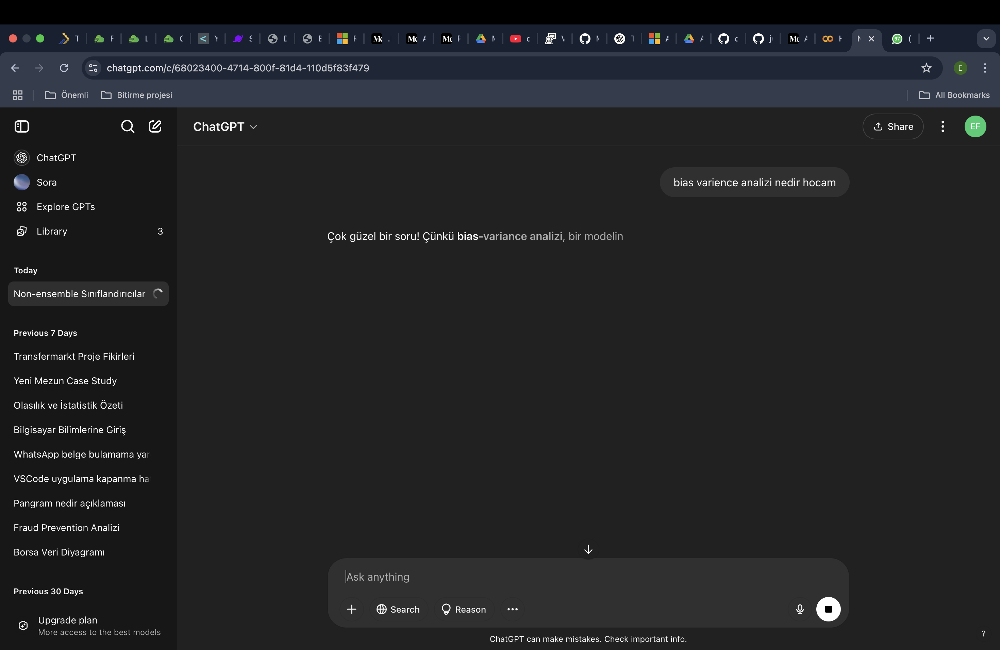

## Q3

For this question, we are going to use a hyperspectral image from Indian Pines test site in North-western Indiana. I provided the data in class' data folder.

In [ ]:
import io
import requests
import scipy.io

response1=requests.get("https://raw.githubusercontent.com/kaygun/MYZ309E/master/data/Indian_pines_corrected.mat")
pinedata = scipy.io.loadmat(io.BytesIO(response1.content))
print(pinedata.keys())
response2=requests.get("https://raw.githubusercontent.com/kaygun/MYZ309E/master/data/Indian_pines_gt.mat")
pinelabels = scipy.io.loadmat(io.BytesIO(response2.content))
print(pinelabels.keys())

dict_keys(['__header__', '__version__', '__globals__', 'indian_pines_corrected'])
dict_keys(['__header__', '__version__', '__globals__', 'indian_pines_gt'])


The data consists of 145 x 145 pixels over 200 spectral reflectance bands in the wavelength range 0.4–2.5 10^(-6) meters. The Indian Pines scene contains two-thirds agriculture, and one-third forest or other natural perennial vegetation. There are two major dual lane highways, a rail line, as well as some low density housing, other built structures, and smaller roads. Since the scene is taken in June some of the crops present, corn, soybeans, are in early stages of growth with less than 5% coverage. The ground truth available is designated into sixteen classes and is not all mutually exclusive. Each pixel has a label attached to it. There are 16 distinct labels encoded as integers from 1 to 16. 0 means unclassified. The labels are stored in `pine_labels`.

In [ ]:
np.unique(pinelabels['indian_pines_gt'].reshape(-1))

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16],
      dtype=uint8)

Since this image is a hyperspectral image, each pixel is an integer vector of dimension 200:

In [ ]:
pinedata['indian_pines_corrected'].shape

(145, 145, 200)

Here is a random band as a grayscale image together with the **ground truth** where color indicates what type crop is planted.

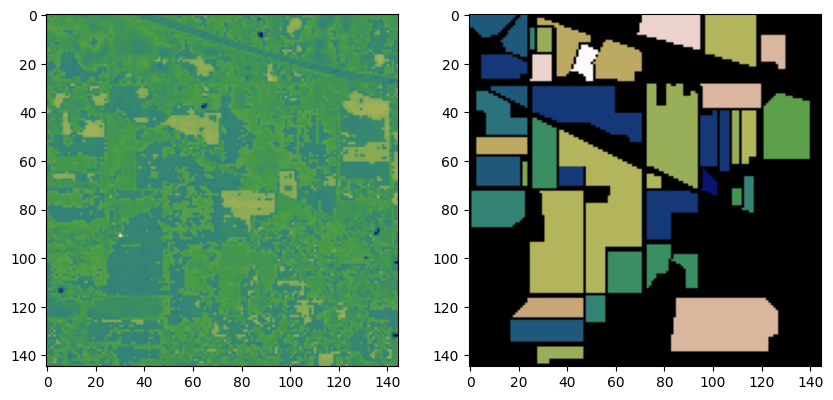

In [ ]:
m = np.random.randint(200)
fig, ax = plt.subplots(ncols=2, figsize=(10,8))
ax[0].imshow(pinedata['indian_pines_corrected'][:,:,m], cmap='gist_earth')
ax[1].imshow(pinelabels['indian_pines_gt'], cmap='gist_earth')

The image you see above on the left is a random band depicted as a grayscale image.

Note that in the previous question you needed to classify (label) each image separately. In this question, you need to classify each pixel (as a 200-dimensional vector) separately.

1. Use all of the non-ensemble classification algorithms we have seen in this class on the pixels of this dataset. Compare their accuracy, precision, and recall using an appropriate cross-validation method. Your results must include a time complexity argument, and an error analysis.
2. Use all of the ensemble classification algorithms given in the lectures using both One-vs-Rest and One-vs-One schemes on the pixels, and compare them. Again, your analyses must include time complexity and error bounds.
3. Which of these options and/or models would you use. Explain.
   
Again, as before, do not construct multi-class models. Instead, construct binary classifiers for each class and test them individually. You need to train your models on the training set, and cross-validate on the test set.

İlk önce veriyi classification algoritmalarına hazır hale getirelim, veriyi 2 boyuta indirgeyip x ve y axislerini belirleyelim. sonra veriyi scale edelim.

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


pinedata = scipy.io.loadmat(io.BytesIO(requests.get("https://raw.githubusercontent.com/kaygun/MYZ309E/master/data/Indian_pines_corrected.mat").content))
pinelabels = scipy.io.loadmat(io.BytesIO(requests.get("https://raw.githubusercontent.com/kaygun/MYZ309E/master/data/Indian_pines_gt.mat").content))

data = pinedata['indian_pines_corrected']
labels = pinelabels['indian_pines_gt']


X = data.reshape(-1, data.shape[2])
y = labels.reshape(-1)

mask = y != 0
X = X[mask]
y = y[mask]


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42, stratify=y)


Şimdi elimizdeki model hem büyük boyutlu(dim) hem de büyük bir veri olduğu için bakalım logistic regresyonda nasıl bir sonuc alıca.

In [ ]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time

model = LogisticRegression(max_iter=1000, solver='saga', multi_class='multinomial')

start_train = time.time()
model.fit(X_train, y_train)
end_train = time.time()

start_pred = time.time()
y_pred = model.predict(X_test)
end_pred = time.time()

accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
cv_scores = cross_val_score(model, X, y, cv=5)

print("📌 Logistic Regression Accuracy:", accuracy)
print("\n📄 Classification Report:\n", report)
print("\n📊 Confusion Matrix:\n", conf_matrix)
print("\n📈 Cross-validation Scores:", cv_scores)
print("🔁 Mean CV Accuracy:", np.mean(cv_scores))
print("⏱️ Training Time: {:.2f} seconds".format(end_train - start_train))
print("⏱️ Prediction Time: {:.2f} seconds".format(end_pred - start_pred))


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1247: 

📌 Logistic Regression Accuracy: 0.8422764227642277

📄 Classification Report:
               precision    recall  f1-score   support

           1       1.00      0.71      0.83        14
           2       0.84      0.85      0.85       428
           3       0.76      0.63      0.69       249
           4       0.80      0.69      0.74        71
           5       0.90      0.92      0.91       145
           6       0.96      0.99      0.97       219
           7       1.00      0.75      0.86         8
           8       0.95      1.00      0.98       143
           9       0.86      1.00      0.92         6
          10       0.77      0.74      0.75       292
          11       0.78      0.82      0.80       737
          12       0.77      0.78      0.77       178
          13       1.00      1.00      1.00        61
          14       0.94      0.96      0.95       380
          15       0.86      0.78      0.81       116
          16       1.00      0.93      0.96        28

  

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Öncelikle accuracy %84 gelmesi ve mean cv scorumuzun 0.71 olması modelin tahminlemem konusunda iyiye yakın fena olmadığını göösteriyor. 2. olarak training time ve prediction time 1.5 dakika ama kodu çalıstırdığımda cv scores hesaplanırken 10 dakika geçmesi modelin büyük boyutlu veriyi train ederken kolayca ettiğini ama cv score bakarken veri sayısının çok fazla olmasından dolayı zorlandığını kanıtladı.

Şimdi diğer ensemble modellerimiz buboyutta zorlanacağı için  %95 varyanslı pca uygulayalım.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)


print(f'Original data shape: {X.shape}')
print(f'PCA data shape: {X_pca.shape}')


Original data shape: (10249, 200)
PCA data shape: (10249, 9)



📌 SVM Accuracy: 0.7229268292682927

📄 SVM Classification Report:
               precision    recall  f1-score   support

           1       0.00      0.00      0.00        14
           2       0.65      0.58      0.61       428
           3       0.89      0.46      0.61       249
           4       0.71      0.21      0.33        71
           5       0.91      0.76      0.83       145
           6       0.73      0.95      0.83       219
           7       0.00      0.00      0.00         8
           8       0.86      0.99      0.92       143
           9       0.00      0.00      0.00         6
          10       0.67      0.67      0.67       292
          11       0.64      0.89      0.74       737
          12       0.54      0.31      0.39       178
          13       0.91      0.98      0.94        61
          14       0.86      0.98      0.92       380
          15       0.73      0.19      0.30       116
          16       1.00      0.82      0.90        28

    accuracy 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


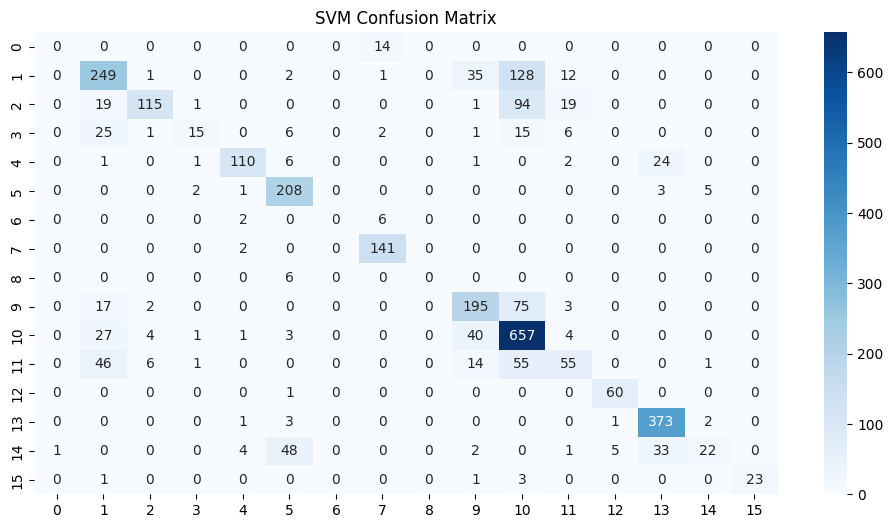

⏱️ SVM Training Time: 1.77 seconds
⏱️ SVM Prediction Time: 2.20 seconds

🔁 SVM CV Scores: [0.51707317 0.67219512 0.70536585 0.6702439  0.63201562]
📈 SVM CV Mean Accuracy: 0.6394
📉 SVM CV Std Dev: 0.0654
⏱️ SVM CV Time: 10.17 seconds


In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns

# Eğitim ve test setlerine ayır
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42, stratify=y)

# SVM modelini kur

svm = SVC(kernel='rbf', C=1, gamma='scale')

start_train = time.time()
svm.fit(X_train, y_train)
end_train = time.time()

start_pred = time.time()
y_pred_svm = svm.predict(X_test)
end_pred = time.time()

acc_svm = accuracy_score(y_test, y_pred_svm)

print("\n📌 SVM Accuracy:", acc_svm)
print("\n📄 SVM Classification Report:\n", classification_report(y_test, y_pred_svm))

print("\n📊 SVM Confusion Matrix:")
plt.figure(figsize=(12, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_svm), annot=True, fmt='d', cmap='Blues')
plt.title("SVM Confusion Matrix")
plt.show()

print("⏱️ SVM Training Time: {:.2f} seconds".format(end_train - start_train))
print("⏱️ SVM Prediction Time: {:.2f} seconds".format(end_pred - start_pred))

# 🔁 Cross-validation (SVM)
start_cv_svm = time.time()
svm_cv_scores = cross_val_score(SVC(kernel='rbf', C=1, gamma='scale'), X_pca, y, cv=5)
end_cv_svm = time.time()

print("\n🔁 SVM CV Scores:", svm_cv_scores)
print("📈 SVM CV Mean Accuracy: {:.4f}".format(svm_cv_scores.mean()))
print("📉 SVM CV Std Dev: {:.4f}".format(svm_cv_scores.std()))
print("⏱️ SVM CV Time: {:.2f} seconds".format(end_cv_svm - start_cv_svm))

Accuracy 0.72 olmasına rağmen cv scoresun 0.5 dolaylarında gelmesi pca nın veriyi bozduğunu gösteriyor ama hızlı bir sekilde çalıstırmak için veriyi küçültmeliydik demek ki verinin dağılımı çok da genel olmamıs.


📌 KNN Accuracy: 0.7469918699186991

📄 KNN Classification Report:
               precision    recall  f1-score   support

           1       0.57      0.29      0.38        14
           2       0.60      0.65      0.63       428
           3       0.79      0.62      0.70       249
           4       0.57      0.35      0.43        71
           5       0.85      0.88      0.87       145
           6       0.78      0.96      0.86       219
           7       0.83      0.62      0.71         8
           8       0.91      0.97      0.94       143
           9       1.00      0.17      0.29         6
          10       0.66      0.82      0.73       292
          11       0.75      0.77      0.76       737
          12       0.52      0.37      0.43       178
          13       0.88      0.98      0.93        61
          14       0.91      0.94      0.93       380
          15       0.73      0.32      0.44       116
          16       1.00      0.79      0.88        28

    accuracy 

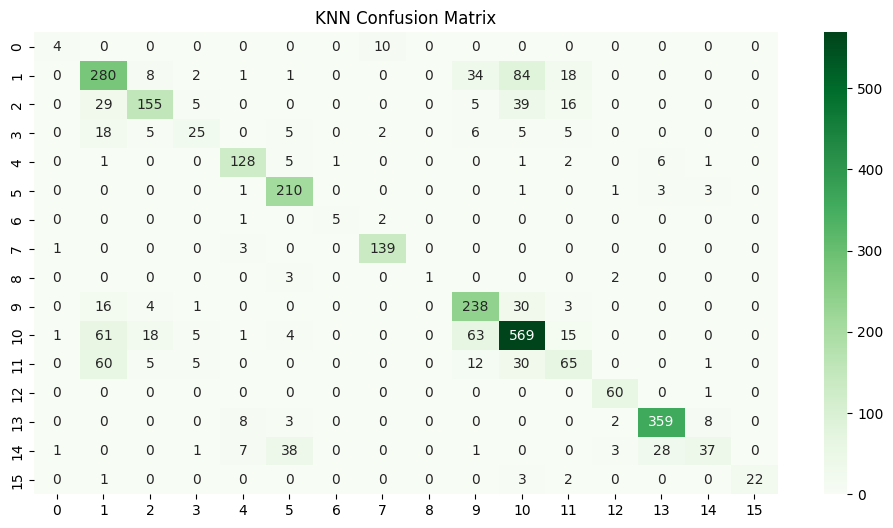

⏱️ KNN Training Time: 0.04 seconds
⏱️ KNN Prediction Time: 0.43 seconds

🔁 KNN CV Scores: [0.49219512 0.66439024 0.69317073 0.68439024 0.59346022]
📈 KNN CV Mean Accuracy: 0.6255
📉 KNN CV Std Dev: 0.0753
⏱️ KNN CV Time: 1.28 seconds


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)

start_train_knn = time.time()
knn.fit(X_train, y_train)
end_train_knn = time.time()

start_pred_knn = time.time()
y_pred_knn = knn.predict(X_test)
end_pred_knn = time.time()

acc_knn = accuracy_score(y_test, y_pred_knn)

print("\n📌 KNN Accuracy:", acc_knn)
print("\n📄 KNN Classification Report:\n", classification_report(y_test, y_pred_knn))

print("\n📊 KNN Confusion Matrix:")
plt.figure(figsize=(12, 6))
sns.heatmap(confusion_matrix(y_test, y_pred_knn), annot=True, fmt='d', cmap='Greens')
plt.title("KNN Confusion Matrix")
plt.show()

print("⏱️ KNN Training Time: {:.2f} seconds".format(end_train_knn - start_train_knn))
print("⏱️ KNN Prediction Time: {:.2f} seconds".format(end_pred_knn - start_pred_knn))

start_cv_knn = time.time()
knn_cv_scores = cross_val_score(KNeighborsClassifier(n_neighbors=5), X_pca, y, cv=5)
end_cv_knn = time.time()

print("\n🔁 KNN CV Scores:", knn_cv_scores)
print("📈 KNN CV Mean Accuracy: {:.4f}".format(knn_cv_scores.mean()))
print("📉 KNN CV Std Dev: {:.4f}".format(knn_cv_scores.std()))
print("⏱️ KNN CV Time: {:.2f} seconds".format(end_cv_knn - start_cv_knn))


Knn pca uygulanmıs haline bakınca accuracy ve cv means arası bu kadar fark olması verinin pca sırasında belki de önemli bir bilgisini kaybettiğini gösterir.Modelimiz overfit olmus.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
import scipy.io
import requests
import io

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
def evaluate_model(model, name):
    print(f"\n🔍 Evaluating: {name}")
    start_train = time.time()
    model.fit(X_train, y_train)
    end_train = time.time()

    start_pred = time.time()
    y_pred = model.predict(X_test)
    end_pred = time.time()

    acc = model.score(X_test, y_test)
    print(f"\n✅ Accuracy: {acc:.4f}")

    print("\n📄 Classification Report:")
    print(classification_report(y_test, y_pred, digits=4))

    print("📊 Confusion Matrix:")
    plt.figure(figsize=(10, 8))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # Cross-validation
    print("🔁 Cross-validation (5-fold):")
    cv_scores = cross_val_score(model, X_scaled, y, cv=5)
    print(f"Scores: {cv_scores}")
    print(f"Mean CV Accuracy: {np.mean(cv_scores):.4f}")

    # Zaman
    print(f"⏱️ Training Time: {end_train - start_train:.2f} seconds")
    print(f"⏱️ Prediction Time: {end_pred - start_pred:.2f} seconds")



🔍 Evaluating: Random Forest

✅ Accuracy: 0.7967

📄 Classification Report:
              precision    recall  f1-score   support

           1     1.0000    0.4286    0.6000        14
           2     0.7344    0.7173    0.7258       428
           3     0.8333    0.6827    0.7506       249
           4     0.6792    0.5070    0.5806        71
           5     0.9173    0.8414    0.8777       145
           6     0.8443    0.9406    0.8898       219
           7     1.0000    0.7500    0.8571         8
           8     0.9156    0.9860    0.9495       143
           9     0.8000    0.6667    0.7273         6
          10     0.7695    0.8116    0.7900       292
          11     0.7554    0.8589    0.8038       737
          12     0.6716    0.5056    0.5769       178
          13     0.9206    0.9508    0.9355        61
          14     0.8894    0.9526    0.9199       380
          15     0.6234    0.4138    0.4974       116
          16     0.9600    0.8571    0.9057        28

    a

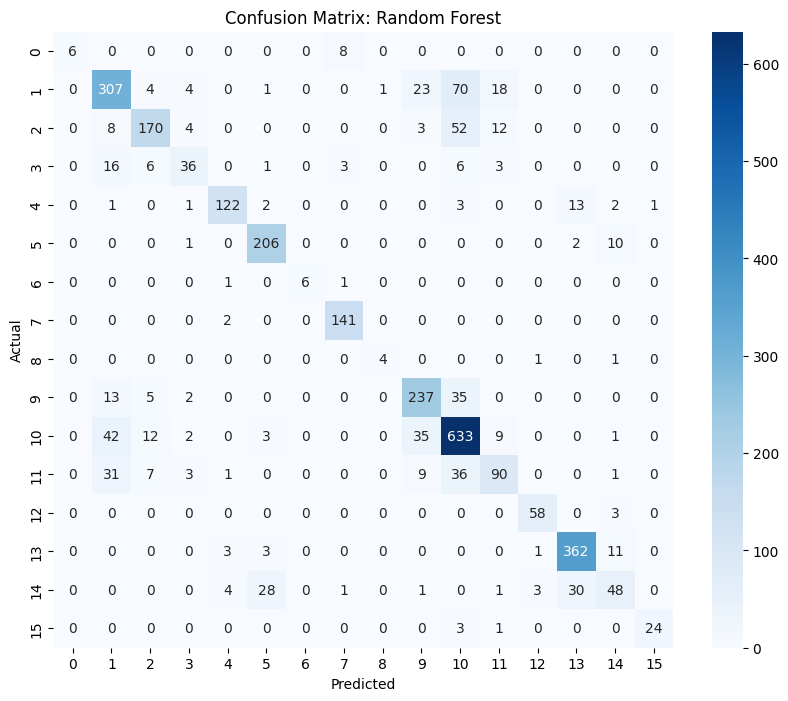

🔁 Cross-validation (5-fold):
Scores: [0.58829268 0.74878049 0.79902439 0.76439024 0.67203514]
Mean CV Accuracy: 0.7145
⏱️ Training Time: 3.57 seconds
⏱️ Prediction Time: 0.07 seconds


In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=42)
evaluate_model(rf, "Random Forest")


modelimizde acccuracy ve cv score un yakın çıkması güzel.


🔍 Evaluating: AdaBoost

✅ Accuracy: 0.3925

📄 Classification Report:
              precision    recall  f1-score   support

           1     0.0000    0.0000    0.0000        14
           2     0.2444    0.6332    0.3526       428
           3     0.2514    0.1807    0.2103       249
           4     0.3125    0.0704    0.1149        71
           5     0.2318    0.2414    0.2365       145
           6     0.8261    0.4338    0.5689       219
           7     0.0000    0.0000    0.0000         8
           8     0.8859    0.9231    0.9041       143
           9     0.0000    0.0000    0.0000         6
          10     0.1957    0.0308    0.0533       292
          11     0.2867    0.2280    0.2540       737
          12     0.3091    0.0955    0.1459       178
          13     0.0000    0.0000    0.0000        61
          14     0.7470    0.9711    0.8444       380
          15     0.2803    0.3793    0.3223       116
          16     1.0000    0.6071    0.7556        28

    accura

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


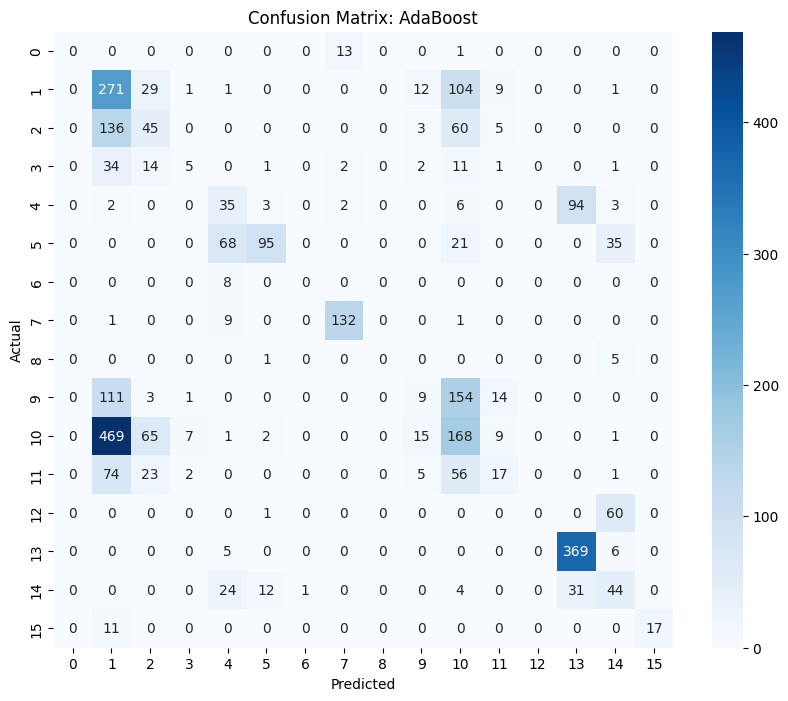

🔁 Cross-validation (5-fold):
Scores: [0.32439024 0.44536585 0.43804878 0.40195122 0.49780381]
Mean CV Accuracy: 0.4215
⏱️ Training Time: 2.36 seconds
⏱️ Prediction Time: 0.07 seconds


In [ ]:
ab = AdaBoostClassifier(n_estimators=100, random_state=42)
evaluate_model(ab, "AdaBoost")


Ada baya kötü bir sonuc verdi.

In [ ]:
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
evaluate_model(gb, "Gradient Boosting")


18 dakika bekleme sonucunda gradient boost algoritması cv scoresları bulamadı, pca uygulayacam.

⏱️ Model eğitimi ve tahmini toplam süre: 30.34 saniye
✅ CV Scores: [0.49756098 0.63707317 0.68780488 0.69268293 0.65544168]
📊 Ortalama CV Skoru: 0.6341
⏱️ CV süresi: 106.70 saniye

📋 Classification Report:

              precision    recall  f1-score   support

           1       0.30      0.19      0.23        16
           2       0.66      0.62      0.64       269
           3       0.77      0.57      0.65       177
           4       0.59      0.41      0.48        39
           5       0.84      0.76      0.80        97
           6       0.78      0.92      0.85       156
           7       0.22      0.50      0.31         4
           8       0.86      0.90      0.88       105
           9       0.33      0.50      0.40         2
          10       0.71      0.76      0.73       208
          11       0.67      0.82      0.74       469
          12       0.56      0.32      0.41       122
          13       0.88      0.85      0.87        34
          14       0.86      0.95   

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


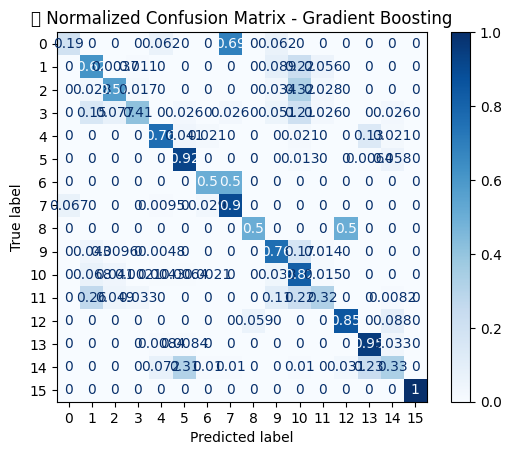

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)


model = GradientBoostingClassifier(
    n_estimators=50,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    random_state=42
)


start = time.time()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
end = time.time()
print(f"⏱️ Model eğitimi ve tahmini toplam süre: {end - start:.2f} saniye")

cv_start = time.time()
cv_scores = cross_val_score(model, X_pca, y, cv=5, scoring='accuracy', n_jobs=-1)
cv_end = time.time()
print("✅ CV Scores:", cv_scores)
print(f"📊 Ortalama CV Skoru: {cv_scores.mean():.4f}")
print(f"⏱️ CV süresi: {cv_end - cv_start:.2f} saniye")

print("\n📋 Classification Report:\n")
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, normalize='true')
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("📊 Normalized Confusion Matrix - Gradient Boosting")
plt.show()


Yine accuracy ve cv score muz aynı olmasa da yakın. Bu soru için de kullanıcağım model logistic regression olurdu hem veriye uygun bir model olması(çok boyutlu) hem de iyi bir accuracy ve ona yakın cv score vermesinden dolayı hem de açıklanabilir bir model olmasıyla en mantıklı seçim.

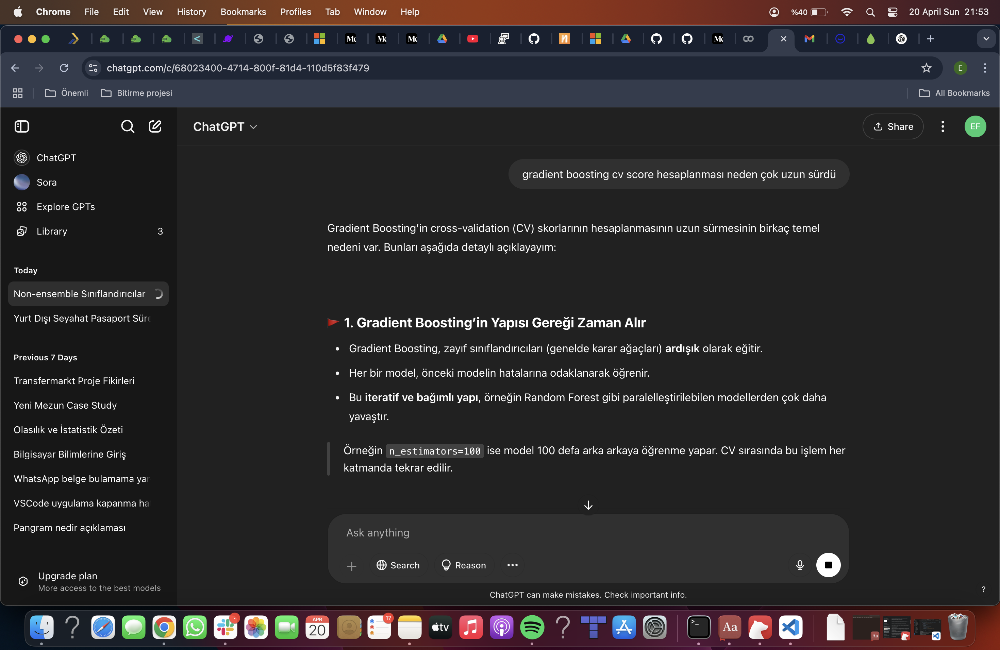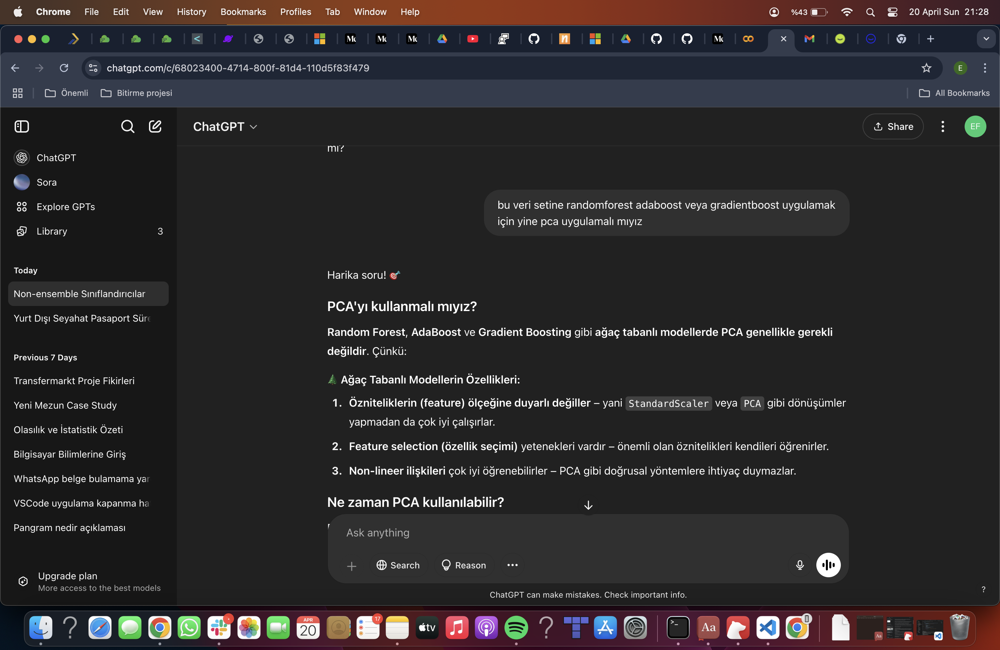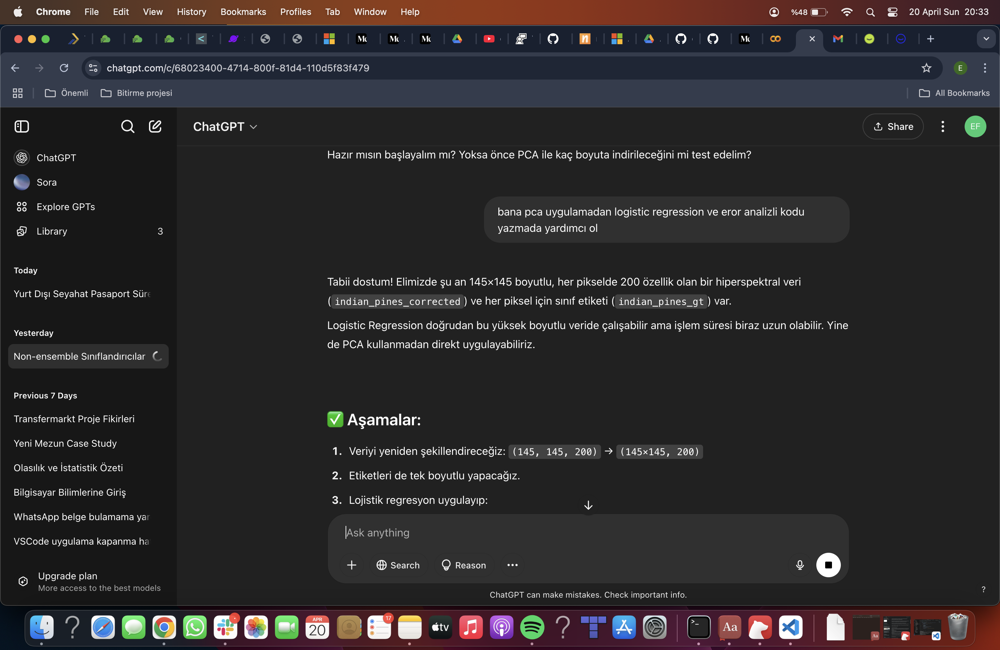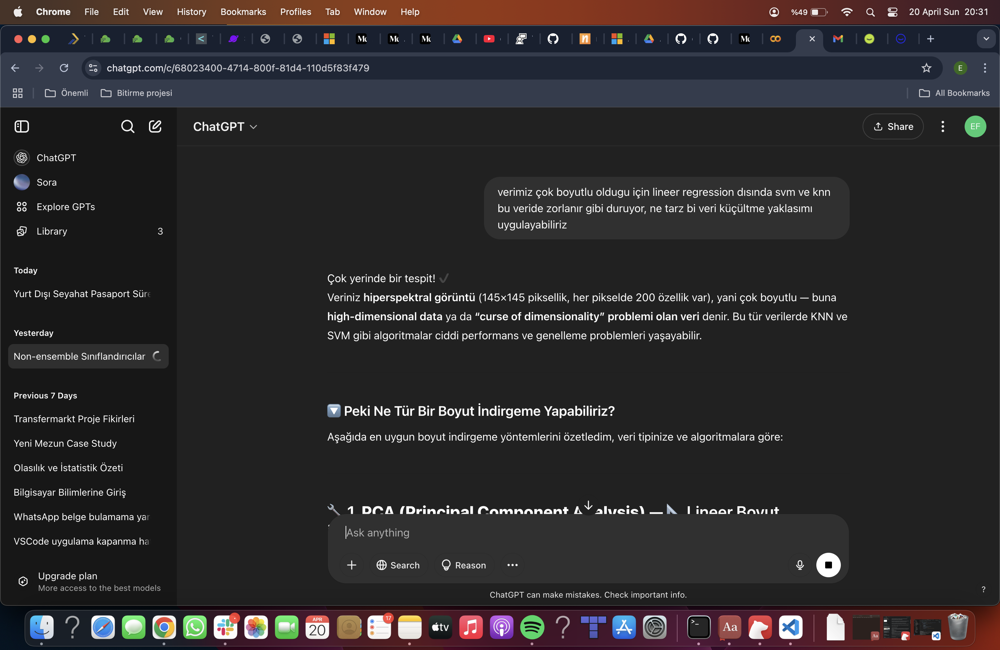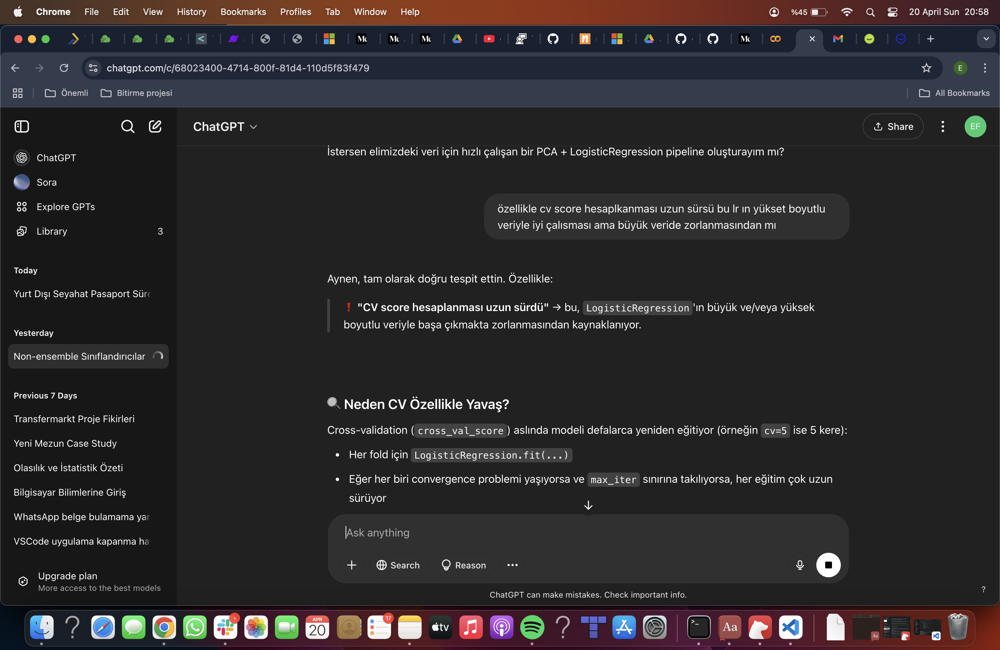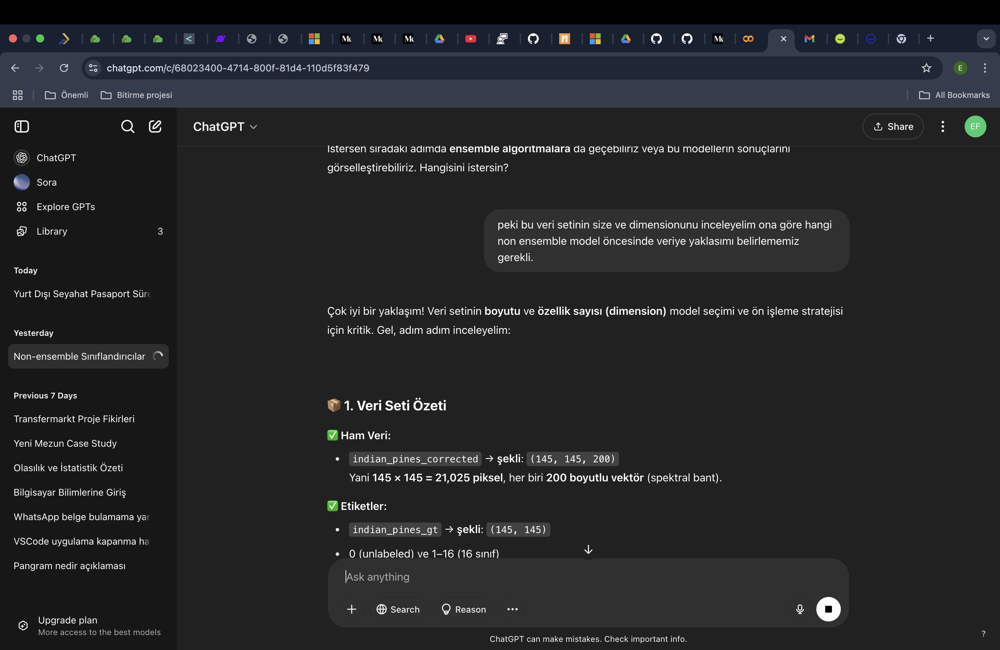